# DETR (**DE**tection **TR**ansformer)

**Table of contents**<a id='toc0_'></a>    
- [DETR: Explained](#toc1_)    
  - [DETR Architecture](#toc1_1_)    
  - [Dynamic Spatial Insights using Object Query Embeddings](#toc1_2_)
  - [DETR's Edge: A Deep Dive into the Set-Based Matching Loss](#toc1_3_)    
- [DETR: Code](#toc2_)
  - [Setup](#toc2_1_)    
  - [Inference & Evaluation (IoU & mAP)](#toc2_2_)    
    - [Inference](#toc2_2_1_)
    - [Computing IoU](#toc2_2_2_)   
- [DETR: Analysis & Interpretability](#toc3_) 
    - [Activation Visualization](#toc3_1_)   
    - [GradCAM](#toc3_2_)
    - [GradCAM++](#toc3_3_)    
    - [EigenCAM](#toc3_4_)   
    - [AblationCAM](#toc3_5_)
    - [Deep Feature Factorizations.](#toc3_6_)
    - [ScoreCAM](#toc3_7_)

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

___
# <a id='toc1_'></a>[DETR: Explained](#toc1_)

## <a id='toc1_1_'></a>[DETR Architecture](#toc1_1_)

DETR, or DEtection TRansformer, is a revolutionary object detection algorithm introduced by Nicolas Carion et al. in their 2020 paper, [End-to-End Object Detection with Transformers](https://arxiv.org/abs/2005.12872). Unlike traditional object detection methods, which rely on the combination of region proposal networks and region-based convolutional neural networks, DETR takes a transformer-based approach for end-to-end object detection. The key components and processes of DETR can be summarized as follows:

1. **Image Encoder**: Similar to the backbone network in Faster R-CNN, DETR starts with an image encoder to extract features from the input image. However, instead of using a convolutional neural network, DETR employs a transformer encoder, the same architecture that has proven highly effective in natural language processing tasks.

2. **Object Query Embeddings**: DETR introduces the concept of object query embeddings, representing learnable parameters that serve as queries in the transformer architecture. These queries are used to attend to different spatial locations in the feature map obtained from the image encoder, enabling the model to focus on relevant regions for object detection.

3. **Transformer Decoder**: The transformer decoder takes the attended feature map and processes it to output a set of object queries. Each object query is associated with a predicted class label and bounding box coordinates. The transformer decoder inherently captures the contextual information and dependencies between different objects in the image, making DETR capable of handling object detection as a holistic, end-to-end task.

4. **Loss Function**: DETR utilizes a unique set-based matching loss function to handle the variable number of objects in an image. This loss function efficiently matches predicted and ground truth object queries, considering both classification and bounding box regression tasks. The use of a set-based approach makes DETR robust to permutations in the order of predicted objects.

DETR represents a paradigm shift in object detection by leveraging transformer architectures, originally designed for sequence-to-sequence tasks. The end-to-end nature of DETR eliminates the need for region proposal networks and region-based processing, simplifying the object detection pipeline. This innovative approach has demonstrated competitive performance on various benchmarks and has sparked significant interest in the computer vision community, paving the way for transformer-based architectures in object detection tasks.




## <a id='toc1_2_'></a>[Dynamic Spatial Insights using Object Query Embeddings](#toc0_)
Object Query Embeddings in DETR are learnable parameters associated with each object query, playing a pivotal role in guiding the attention mechanism of the transformer decoder.

During the decoding process, these embeddings serve as queries that dynamically influence the model's focus on different spatial locations in the feature map, replacing the need for predefined anchor boxes. The learnable nature of Object Query Embeddings allows the model to adapt its attention based on the dataset characteristics and the semantic content of the input image. This dynamic spatial attention mechanism enables DETR to capture intricate relationships between objects, contributing to its end-to-end object detection capabilities.

By integrating Object Query Embeddings into the transformer decoder, DETR achieves a more flexible and adaptive approach to handling objects of various sizes and aspect ratios, enhancing the model's performance in capturing diverse object appearances and spatial configurations.

___
# <a id='toc2_'></a>[DETR: Code](#toc2_)

In [29]:
import os
import json
import matplotlib.pyplot as plt

import torch
import torchvision
import supervision as sv

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

from transformers import DetrImageProcessor, DetrForObjectDetection

## <a id='toc2_1_'></a>[Setup](#toc2_1_)

#### Setting up the Model

In [30]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
detr_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
detr = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50").to(DEVICE)

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


#### Setting up the Dataset

In [31]:
ANNOTATION_FILE_NAME = "E:\\COCO\\val2017\\annotations.json"
VAL_DIRECTORY = "E:\\COCO\\val2017\\val2017"

class DetrDataset(torchvision.datasets.CocoDetection):

    def __init__(
        self,
        image_directory_path: str,
        annotation_file_path: str,
        image_processor: DetrImageProcessor
        ):
        super(DetrDataset, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        images, annotations = super(DetrDataset, self).__getitem__(idx)
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"]. squeeze()
        target = encoding["labels"][0]

        return pixel_values, target

VAL_DATASET = DetrDataset(image_directory_path=VAL_DIRECTORY, annotation_file_path=ANNOTATION_FILE_NAME, image_processor=detr_processor)

print("Number of validation examples:", len(VAL_DATASET))

loading annotations into memory...
Done (t=4.46s)
creating index...
index created!
Number of validation examples: 5000


#### Visualizing some annotated samples

Image #463174


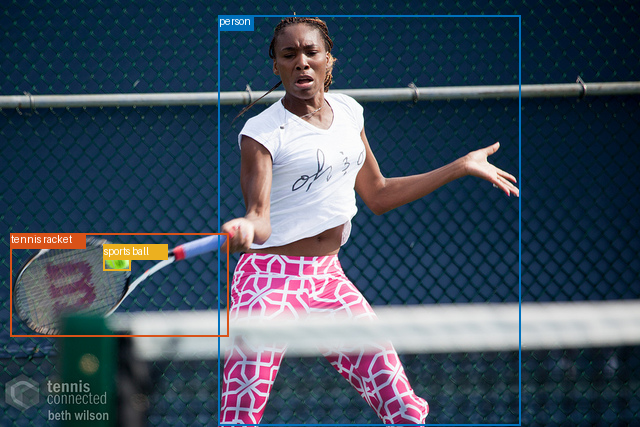

In [32]:
import numpy as np
import os
import random
from PIL import Image, ImageDraw

def visualize_gt(image_id):
    print('Image #{}'.format(image_id))

    image = VAL_DATASET.coco.loadImgs(image_id)[0]
    image = Image.open(os.path.join(VAL_DIRECTORY, image['file_name']))

    annotations = VAL_DATASET.coco.imgToAnns[image_id]
    draw = ImageDraw.Draw(image, "RGBA")

    cats = VAL_DATASET.coco.cats
    id2label = {k: v['name'] for k,v in cats.items()}

    COLORS = [(0.000, 0.447, 0.741), (0.850, 0.325, 0.098), (0.929, 0.694, 0.125),
              (0.494, 0.184, 0.556), (0.466, 0.674, 0.188), (0.301, 0.745, 0.933)]*100

    for annotation in annotations:
        ann_color = random.choice(COLORS)
        ann_color = tuple([int(x * 255) for x in ann_color])

        box = annotation['bbox']
        class_idx = annotation['category_id']
        x,y,w,h = tuple(box)
        draw.rectangle((x,y,x+w,y+h), outline=ann_color, width=2)

        text = id2label[class_idx]
        text_bg_width, text_bg_height = len(text) * 5.8, 15
        draw.rectangle((x, y, x + text_bg_width, y + text_bg_height), fill=ann_color)
        draw.text((x, y), text, fill='white')

    return image

visualize_gt(VAL_DATASET.ids[4000])


## <a id='toc2_2_'></a>[Inference & Evaluation (IoU & mAP)](#toc2_2_)

The HuggingFace `transformers` library offers a range of transformer-based models for various natural language processing and computer vision tasks, including object detection. For DETR (DEtection TRansformer), the library provides pretrained models and processing utilities. Here's an overview of the DETR models available in Hugging Face:

1. `facebook/detr-resnet-50`: This DETR model features a ResNet-50 backbone and is pretrained on the COCO dataset. It is designed for end-to-end object detection, utilizing the transformer architecture for both feature extraction and object prediction.

2. `facebook/detr-resnet-50-panoptic`: Similar to the above, this DETR model incorporates a ResNet-50 backbone but is specifically pretrained for panoptic segmentation tasks. Panoptic segmentation aims to assign semantic labels to every pixel in an image, distinguishing between stuff and things.

3. `facebook/detr-resnet-101`: An alternative to the ResNet-50-based model, this DETR variant utilizes a ResNet-101 backbone. It is pretrained on the COCO dataset, offering a potentially more powerful feature extraction capability due to the deeper backbone architecture.

### <a id='toc1_4_1_'></a>[Inference](#toc2_2_1_)

In [33]:
CONFIDENCE_TRESHOLD = 0.9

In [34]:
def infer(model: DetrForObjectDetection, image_index: int, root_dir: str = VAL_DIRECTORY, dataset: DetrDataset = VAL_DATASET, device: torch.device = DEVICE):
    pixel_values, target = dataset[image_index]
    pixel_values = pixel_values.unsqueeze(0).to(device)
    image_id = target['image_id'].item()

    with torch.no_grad():
        outputs = model(pixel_values=pixel_values, pixel_mask=None)

    # load image based on ID
    image = dataset.coco.loadImgs(image_id)[0]
    image = Image.open(os.path.join(root_dir, image['file_name']))

    # postprocess model outputs
    width, height = image.size
    postprocessed_outputs = detr_processor.post_process_object_detection(outputs, target_sizes=[(height, width)], threshold=CONFIDENCE_TRESHOLD)
    results = postprocessed_outputs[0]

    return {'image_id': image_id, 'image': image, 'results': results}

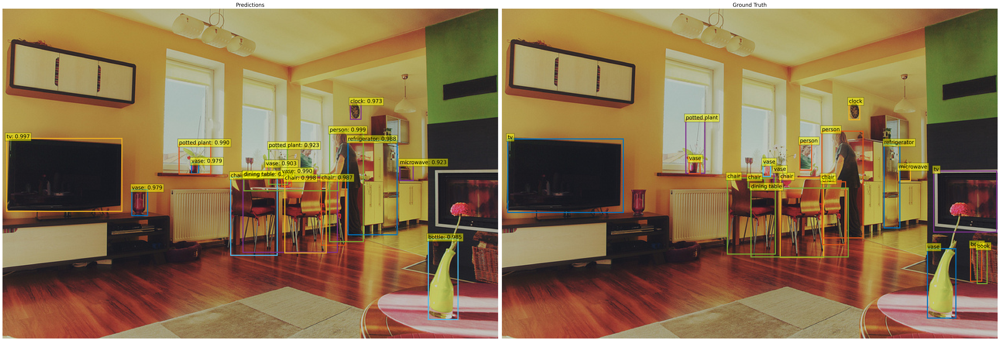

In [52]:
image_id, image, results = infer(detr, 0).values()

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, scores, labels, boxes, figsize=(40, 20), show_ground_truth=True):

    fig = plt.figure(figsize=figsize)
    if show_ground_truth:
        ax = plt.subplot(1, 2, 1)
    else:
        ax = plt.subplot(1, 1, 1)
    colors = COLORS * 100
    for score, label, (xmin, ymin, xmax, ymax),c  in zip(scores.tolist(), labels.tolist(), boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        text = f'{detr.config.id2label[label]}: {score:.3f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
        ax.set_title(f'Predictions', fontsize=15)
    ax.imshow(pil_img)
    ax.axis('off')

    if show_ground_truth:
        ax = plt.subplot(1, 2, 2)
        ax.imshow(pil_img)
        ann_ids = VAL_DATASET.coco.getAnnIds(imgIds=image_id)
        annotations = VAL_DATASET.coco.loadAnns(ann_ids)
        for annotation in annotations:
            box = annotation['bbox']
            class_idx = annotation['category_id']
            x,y,w,h = tuple(box)
            ax.add_patch(plt.Rectangle((x, y), w, h,
                                    fill=False, color=random.choice(COLORS), linewidth=3))
            text = f'{detr.config.id2label[class_idx]}'
            ax.text(x, y, text, fontsize=15,
                    bbox=dict(facecolor='yellow', alpha=0.5))
            ax.set_title(f'Ground Truth', fontsize=15)
        ax.axis('off')

    fig.tight_layout()

    plt.show()

plot_results(image, results['scores'], results['labels'], results['boxes'], show_ground_truth=True);

In [ ]:
# all_results = []
# for sample_idx in tqdm(range(len(VAL_DATASET))):
#     image_id, image, results = infer(detr, sample_idx).values()

#     pred_boxes = results['boxes'].data.cpu().numpy()
#     pred_scores = results['scores'].data.cpu().numpy()
#     pred_labels = results['labels'].data.cpu().numpy()

#     # Adding predictions to the list
#     for i, (box, score, label) in enumerate(zip(pred_boxes, pred_scores, pred_labels)):
#         box_height = box[3] - box[1]
#         box_width = box[2] - box[0]
#         new_box = np.array([box[0], box[1], box_width, box_height])
#         prediction = {
#             'image_id': int(image_id),
#             'category_id': int(label),
#             'bbox': new_box.tolist(),
#             'score': float(score)
#         }
#         all_results.append(prediction)

# with open('detr_predictions.json', 'w') as f:
#     json.dump(all_results, f)

### <a id='toc2_2_2_'></a>[Computing IoU](#toc2_2_2_)

In [ ]:
def get_intersection(box1, box2):
    """
    Computes the intersection between two bounding boxes.

    Args:
        box1 (list): [x1, y1, x2, y2] coordinates of the first bounding box.
        box2 (list): [x1, y1, x2, y2] coordinates of the second bounding box.

    Returns:
        tuple: intersection area coordinates [x1, y1, x2, y2].
        float: intersection area.
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)

    return (x1, y1, x2, y2), intersection

def compute_iou(box1, box2):
    """
    Compute the Intersection over Union (IoU) between two bounding boxes.

    Args:
        box1 (list): [x1, y1, x2, y2] coordinates of the first bounding box.
        box2 (list): [x1, y1, x2, y2] coordinates of the second bounding box.

    Returns:
        float: The IoU value.
    """
    _, intersection_area = get_intersection(box1, box2)
    
    box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)

    union_area = box1_area + box2_area - intersection_area

    iou = intersection_area / union_area

    return iou

#### Visualizing IoU

Prediction #0: tennis racket | Confidence: 0.998


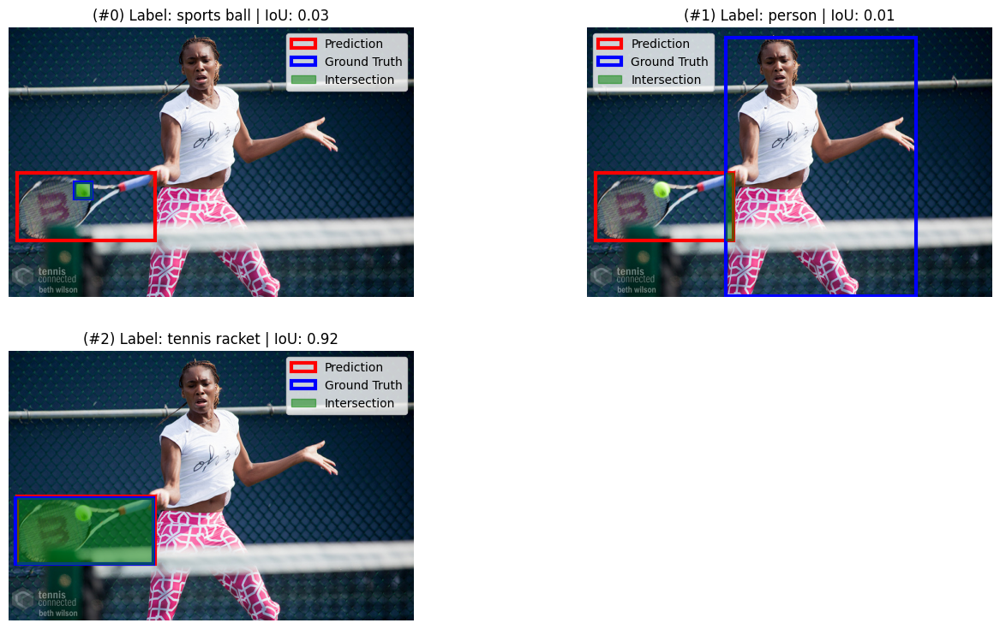

Prediction #1: person | Confidence: 0.999


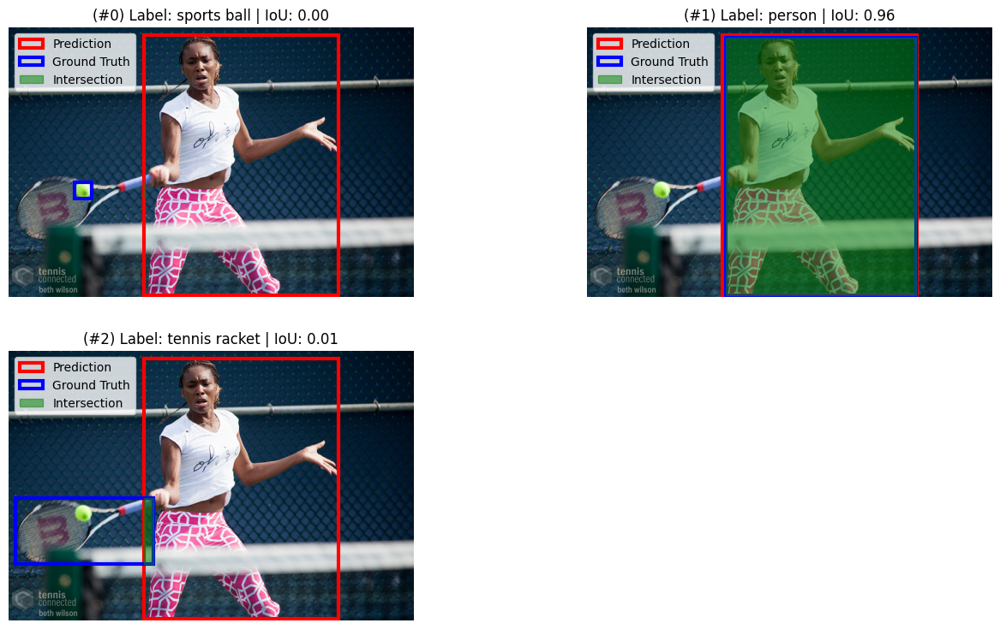

Prediction #2: sports ball | Confidence: 0.996


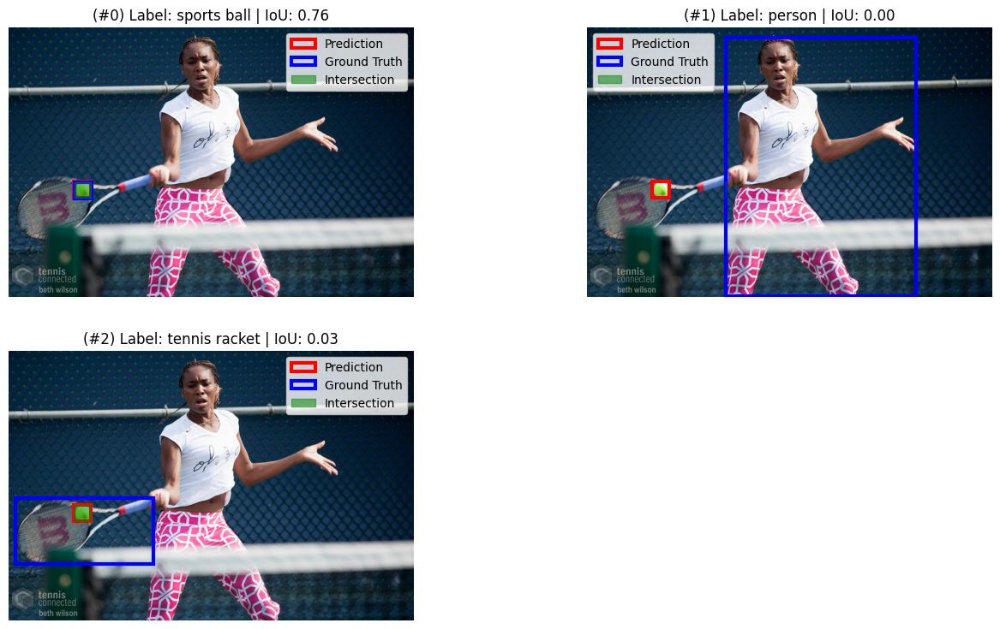


Average IoU: 0.8797778196848723


In [ ]:
image_id, image, results = infer(detr, 4000).values()
gt_annotations = VAL_DATASET.coco.imgToAnns[image_id]

total_iou = 0
for idx, bbox in enumerate(results['boxes'].tolist()):

    # Verbose
    print(f'Prediction #{idx}: {detr.config.id2label[results["labels"].tolist()[idx]]} | Confidence: {results["scores"].tolist()[idx]:.3f}')
    plt.figure(figsize=(9,9))
    num_rows = (len(gt_annotations) + 1) // 2
    
    max_iou = 0
    for ann_idx, gt in enumerate(gt_annotations):
        
        # Taking a shallow copy of the gt_bbox to prevent the changes from reflecting in the original gt_annotations
        gt_bbox = gt['bbox'].copy()

        # Converting from [x, y, w, h] to [x1, y1, x2, y2]
        gt_bbox[2] = gt_bbox[0] + gt_bbox[2]
        gt_bbox[3] = gt_bbox[1] + gt_bbox[3]

        iou = compute_iou(bbox, gt_bbox)
        if iou > max_iou and results['labels'][idx] == gt['category_id']:
            max_iou = iou
        
        # Plotting the image and the bounding boxes with the intersection area
        plt.subplot(num_rows, 2, ann_idx + 1)
        plt.title(f'(#{ann_idx}) Label: {detr.config.id2label[gt["category_id"]]} | IoU: {iou:.2f}')
        plt.imshow(image)
        ax = plt.gca()
        ax.add_patch(plt.Rectangle((bbox[0], bbox[1]), bbox[2] - bbox[0], bbox[3] - bbox[1], fill=False, color='r', linewidth=3, label='Prediction'))
        ax.add_patch(plt.Rectangle((gt_bbox[0], gt_bbox[1]), gt_bbox[2] - gt_bbox[0], gt_bbox[3] - gt_bbox[1], fill=False, color='b', linewidth=3, label='Ground Truth'))
        intersection = get_intersection(bbox, gt_bbox)[0]
        ax.add_patch(plt.Rectangle((intersection[0], intersection[1]), max(0, intersection[2] - intersection[0]), max(0, intersection[3] - intersection[1]),
                                fill=True, color='g', linewidth=1, alpha=0.5, label='Intersection'))
        plt.axis('off')
        plt.legend()

        # Giving some space between the plots
        plt.subplots_adjust(right=1.5)

    plt.show()
    
    total_iou += max_iou
print()
print("Average IoU:", total_iou / len(results['boxes']))

#### Calculating average IoU across all images

In [ ]:
from tqdm import tqdm

total_iou = 0
cnt = 0
for sample_idx in tqdm(range(len(VAL_DATASET))):
    image_id, image, results = infer(detr, sample_idx).values()
    gt_annotations = VAL_DATASET.coco.imgToAnns[image_id]

    sample_iou = 0
    for idx, bbox in enumerate(results['boxes'].tolist()):
        
        max_iou = 0
        for gt in gt_annotations:
            
            # Taking a shallow copy of the gt_bbox to prevent the changes from reflecting in the original gt_annotations
            gt_bbox = gt['bbox'].copy()

            # Converting from [x, y, w, h] to [x1, y1, x2, y2]
            gt_bbox[2] = gt_bbox[0] + gt_bbox[2]
            gt_bbox[3] = gt_bbox[1] + gt_bbox[3]

            iou = compute_iou(bbox, gt_bbox)
            if iou > max_iou and results['labels'][idx] == gt['category_id']:
                max_iou = iou
        
        sample_iou += max_iou
    
    if len(results['boxes']) != 0 and len(gt_annotations) != 0:
        total_iou += (sample_iou / len(results['boxes']))
        cnt += 1

print("Average IoU:", total_iou / cnt)


100%|██████████| 5000/5000 [11:20<00:00,  7.34it/s]
Average IoU: 0.7045393222614829



### <a id='toc2_2_3_'></a>[Computing mAP (mean Average Precision)](#toc2_2_3_)

In [ ]:
with open('detr_predictions.json', 'r') as f:
    all_results = json.load(f)


coco_gt = VAL_DATASET.coco
coco_dt = coco_gt.loadRes(all_results)

coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

mAP = coco_eval.stats[0]

print(f"mAP: {mAP:.3f}")


Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=9.51s).
Accumulating evaluation results...
DONE (t=1.91s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.366
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.523
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.390
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.159
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.398
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.548
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.300
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.421
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

___
# <a id='toc3_'></a>[DETR: Analysis & Interpretability](#toc3_)

In [ ]:
import math

from PIL import Image
import requests
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import ipywidgets as widgets
from IPython.display import display, clear_output
from coco_labels import get_coco_labels

import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False);

In [ ]:
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval()

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

CLASSES = get_coco_labels()

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

Using cache found in C:\Users\drogo/.cache\torch\hub\facebookresearch_detr_main
c:\Users\drogo\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\drogo\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


## <a id='toc3_1_'></a>[Attention Visualization](#toc3_1_)

In this section, we'll visualize the attention maps generated by DETR to gain insights into the model's attention mechanism.

In [ ]:
image_id = VAL_DATASET.ids[4000]
image = VAL_DATASET.coco.loadImgs(image_id)[0]
image_path = os.path.join(VAL_DIRECTORY, image['file_name'])
im = Image.open(image_path)

# mean-std normalize the input image (batch-size: 1)
img = transform(im).unsqueeze(0)

# use lists to store the outputs via up-values
conv_features, enc_attn_weights, dec_attn_weights = [], [], []

hooks = [
    model.backbone[-2].register_forward_hook(
        lambda self, input, output: conv_features.append(output)
    ),
    model.transformer.encoder.layers[-1].self_attn.register_forward_hook(
        lambda self, input, output: enc_attn_weights.append(output[1])
    ),
    model.transformer.decoder.layers[-1].multihead_attn.register_forward_hook(
        lambda self, input, output: dec_attn_weights.append(output[1])
    ),
]

# propagate through the model
outputs = model(img)

# keep only predictions with 0.7+ confidence
probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.9

# convert boxes from [0; 1] to image scales
bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

for hook in hooks:
    hook.remove()

# don't need the list anymore
conv_features = conv_features[0]
enc_attn_weights = enc_attn_weights[0]
dec_attn_weights = dec_attn_weights[0]

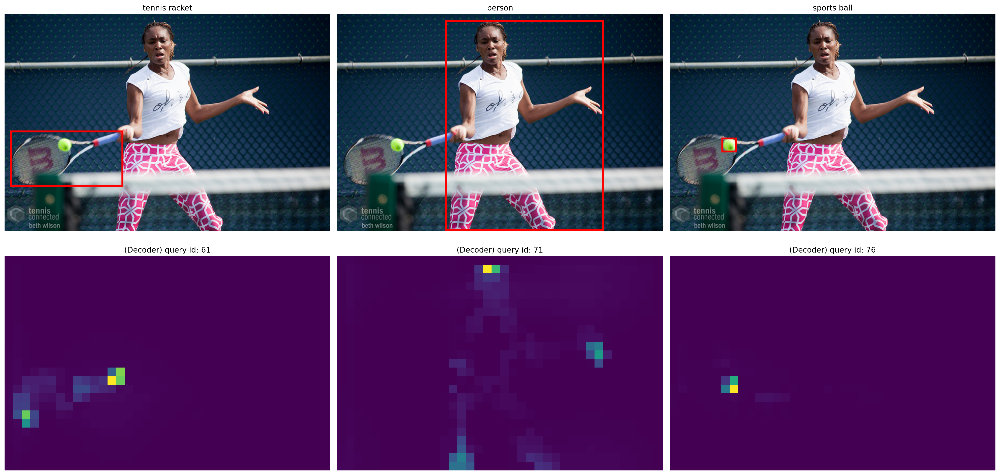

In [ ]:
# get the feature map shape
h, w = conv_features['0'].tensors.shape[-2:]

fig, axs = plt.subplots(ncols=len(bboxes_scaled), nrows=2, figsize=(22, 11))
colors = COLORS * 100
for idx, ax_i, (xmin, ymin, xmax, ymax) in zip(keep.nonzero(), axs.T, bboxes_scaled):
    ax = ax_i[0]
    ax.imshow(im)
    ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, color='r', linewidth=3))
    ax.axis('off')
    ax.set_title(CLASSES[probas[idx].argmax()])

    ax = ax_i[1]
    ax.imshow(dec_attn_weights[0, idx].view(h, w))
    ax.axis('off')
    ax.set_title(f'(Decoder) query id: {idx.item()}')
    
    # ax = ax_i[2]
    # ax.imshow(enc_attn_weights[0, idx].view(h, w))
    # ax.axis('off')
    # ax.set_title(f'(Encoder) key / value id: {idx.item()}')
    
fig.tight_layout()

## <a id='toc3_2_'></a>[GradCAM](#toc3_2_)

GradCAM (Gradient-Weighted Class Activaiton Mapping) introduced by the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/abs/1610.02391) in 2017 is part of explainable AI for computer vision. It is a technique for visualizing and interpreting the predictions of Convolutional Neural Networks (CNNs). It uses the gradients of any target `concept` (say logits for 'dog' or even a caption), flowing into the final convolutional layer to produce a coarse localization map highlighting the important regions in the image for predicting the concept.
The GradCAM technique can be summarized in the following steps:

1. Let $y^c$ be the score for class $c$ before the softmax, and $A^k$ be the activation map of the last convolutional layer. The gradient of $y^c$ w.r.t. $A^k$ is computed as:

$$\alpha^c_k = \frac{1}{Z}\sum_i\sum_j\frac{\partial y^c}{\partial A^k_{ij}}$$

where $Z$ is the number of elements in $A^k$, and $A^k_{ij}$ is the activation at the $i$-th row and $j$-th column of $A^k$.

2. The activation map $L^c_{GradCAM}$ is computed by:

$$L^c_{GradCAM} = ReLU(\sum_k\alpha^c_kA^k)$$

3. Heat map can then be computed by normalizing the activation map $L^c_{GradCAM}$.

4. The heat map is then upsampled to the size of the input image.

**Notes:**

- According to the authors, We find that Grad-CAM maps become progressively worse as we move to earlier convolutional layers as they have smaller receptive fields and only focus on less semantic local features. That is why most people tend to use the last convolutional layer.

C:\Users\drogo\AppData\Local\Temp\ipykernel_38264\3403675597.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(label_idx)
c:\Users\drogo\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weight

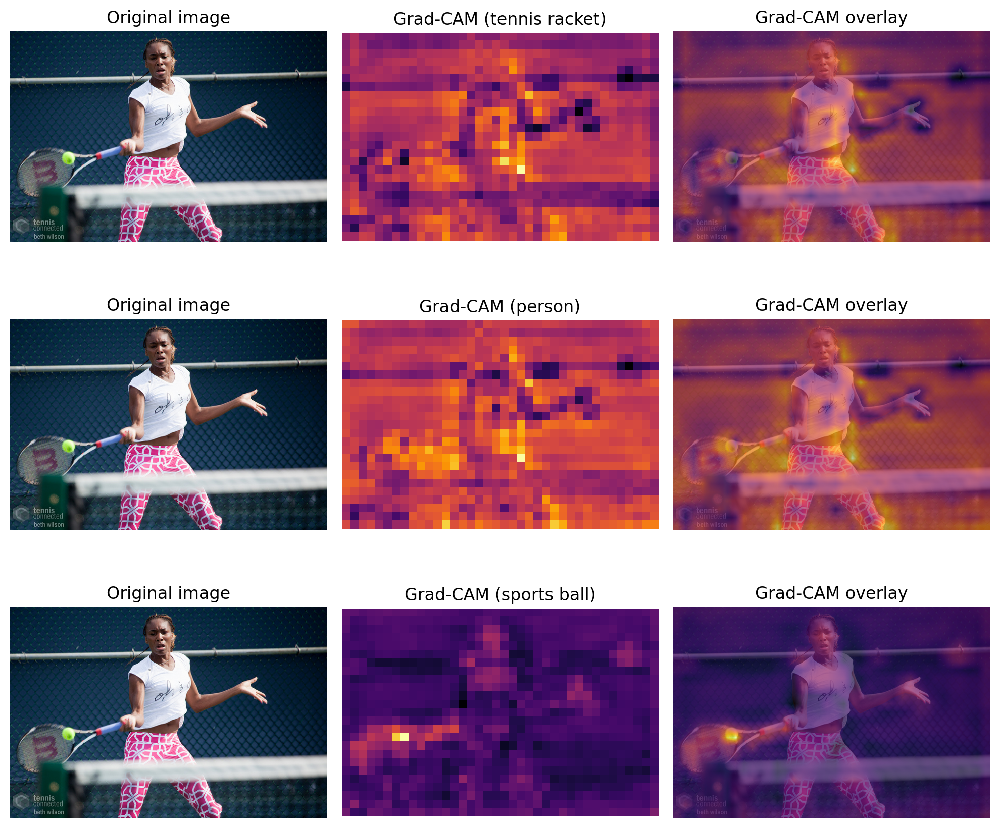

In [ ]:
from captum.attr import LayerGradCam

torch.set_grad_enabled(False)

class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        outputs = self.model(x)
        return outputs['pred_logits'][:, 0, :]  # Select the first query

out = infer(model=detr, image_index=4000)
im = out['image']
img = transform(im).unsqueeze(0)

fig, axes = plt.subplots(len(out['results']['labels']), 3, figsize=(10, 3 * len(out['results']['labels'])))

if len(out['results']['labels']) == 1:
    axes = np.expand_dims(axes, 0)

for idx, label_idx in enumerate(out['results']['labels']):

    # Create the wrapped model
    wrapped_model = ModelWrapper(model)

    # Create the Grad-CAM object with the wrapped model
    layer_gc = LayerGradCam(wrapped_model, model.backbone[-2].body.layer4[2].conv1)

    # Specify the target class
    target = torch.tensor(label_idx)

    # Compute the Grad-CAM for the target class
    gradcam = layer_gc.attribute(img, target=target)

    # To visualize the Grad-CAM, you can sum it over the channel dimension and then
    # normalize it to the range [0, 1]
    gradcam = gradcam.sum(dim=1, keepdim=True)
    gradcam = gradcam / gradcam.max()

    axes[idx, 0].imshow(im)
    axes[idx, 0].axis('off')
    axes[idx, 0].set_title('Original image')

    axes[idx, 1].imshow(gradcam[0, 0], cmap='inferno')
    axes[idx, 1].axis('off')
    axes[idx, 1].set_title(f'Grad-CAM ({CLASSES[label_idx]})')

    # First we need to adjust its size to match the input image, then we need to normalize it to the range [0, 1]
    gradcam = T.Resize(im.size[::-1])(gradcam)
    gradcam = (gradcam - gradcam.min()) / (gradcam.max() - gradcam.min())
    
    axes[idx, 2].imshow(im)
    axes[idx, 2].imshow(gradcam[0, 0], cmap='inferno', alpha=0.7)
    axes[idx, 2].axis('off')
    axes[idx, 2].set_title(f'Grad-CAM overlay')

fig.tight_layout()
plt.show()

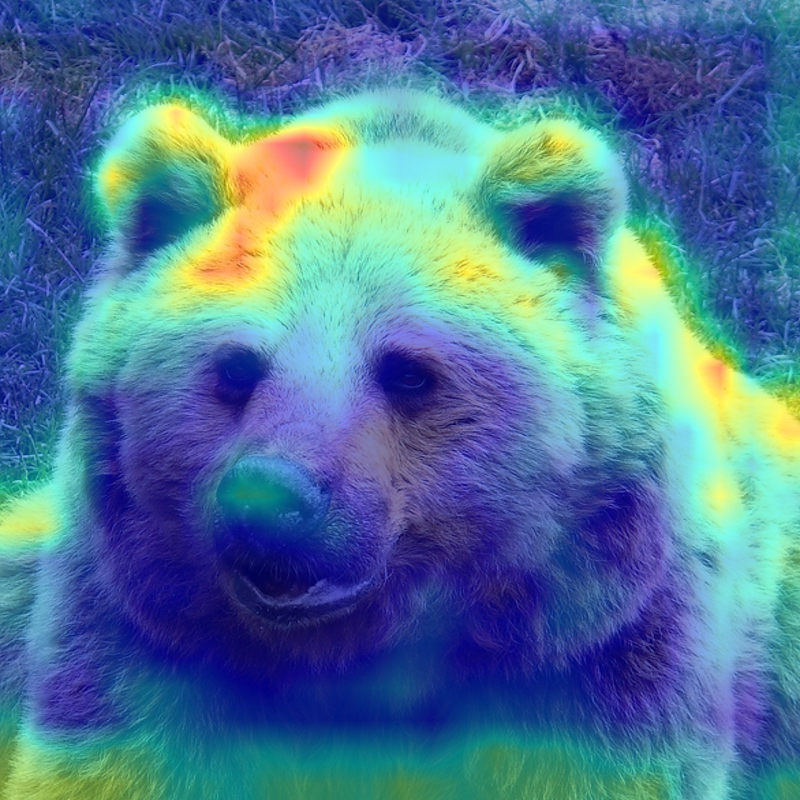

In [55]:
out = infer(model=detr, image_index=1)

torch.set_grad_enabled(True)

from pytorch_grad_cam import GradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2
import numpy as np

import torchvision.transforms as transforms

# Load and preprocess the image
img = out['image']
img = img.resize((800, 800))
img = np.float32(img) / 255
transform_ = transforms.ToTensor()
tensor = transform_(img).unsqueeze(0)

target_layers = [model.backbone[-2].body.layer4[2].conv1,
                    model.backbone[-2].body.layer4[2].conv2,
                    model.backbone[-2].body.layer4[2].conv3,
]


# img = np.float32(img) / 255

# Calculate the CAM (this might need a different approach for DETR)
cam = GradCAM(wrapped_model, target_layers)
grayscale_cam = cam(tensor)[0, :, :]
gradcam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
Image.fromarray(gradcam_image)

## <a id='toc1_7_'></a>[GradCAM++](#toc3_3_)

Grad-CAM++ introduced by Chattopadhyay et al in 2018 in their paper [Grad-CAM++: Improved Visual Explanations for Deep Convolutional Networks](https://arxiv.org/abs/1710.11063) is an extension of Grad-CAM. It refines the localization of important regions by considering higher-order derivatives beyond the first-order gradients. It combines the first and second-order gradients of the target concept to obtain the weights (specifically, the Hessian matrix) for the activation maps. This refinement aims to enhance the localization accuracy of the highlighted regions, providing a more precise understanding of where the model is focusing its attention to make predictions. It is worth noting that the paper offers a concrete mathematical derivation of the Grad-CAM++ which can't be covered here.

![Image](assets/gradcam%20vs%20gradcampp.png)

In [ ]:
out = infer(model=detr, image_index=1)

torch.set_grad_enabled(True)

from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2
import numpy as np

import torchvision.transforms as transforms

# Load and preprocess the image
img = out['image']
img = np.float32(img) / 255
transform_ = transforms.ToTensor()
tensor = transform_(img).unsqueeze(0)

target_layers = [model.backbone[-2].body.layer4[2].conv1,
                    model.backbone[-2].body.layer4[2].conv2,
                    model.backbone[-2].body.layer4[2].conv3,
]


# img = np.float32(img) / 255

# Calculate the CAM (this might need a different approach for DETR)
cam = GradCAMPlusPlus(wrapped_model, target_layers)
grayscale_cam = cam(tensor)[0, :, :]
gradcampp_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
Image.fromarray(gradcampp_image)

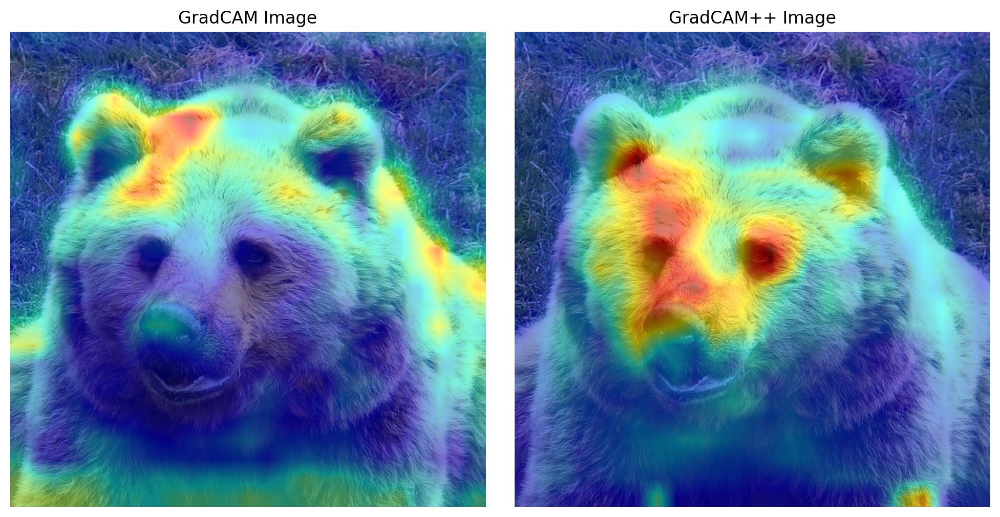

In [57]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Show gradcam_image
axs[0].imshow(gradcam_image)
axs[0].set_title('GradCAM Image')
axs[0].axis('off')

# Show gradcampp_image
axs[1].imshow(gradcampp_image)
axs[1].set_title('GradCAM++ Image')
axs[1].axis('off')

plt.tight_layout()
plt.show()


## <a id='toc1_8_'></a>[EigenCAM](#toc3_3_)

EigenCAM is a class activation mapping technique that provides visual explanations for convolutional neural network (CNN) models. It was introduced by Mohammed Bany Muhammad Mohammed Yeasin in their paper [Eigen-CAM: Class Activation Map using Principal Components](https://arxiv.org/abs/2008.00299). EigenCAM is a generalization of GradCAM and GradCAM++ that uses the principal components using Singular Value Decomposition of the activation maps to compute the weights for the activation maps. This allows EigenCAM to capture the most important features in the activation maps, providing a more accurate localization of the important regions in the input image.

The main advantage is the ability to give robust explanations for the model's predictions even if it is misclassified. This is because EigenCAM uses the principal components of the activation maps, which are not affected by the model's predictions and doesn't require gradient information. This is in contrast to GradCAM and GradCAM++, which use the gradients of the model's predictions to compute the weights for the activation maps. This means that GradCAM and GradCAM++ can give misleading explanations if the model's predictions are incorrect.

![Image](assets/eigenmap%20vs%20gradcam.png)

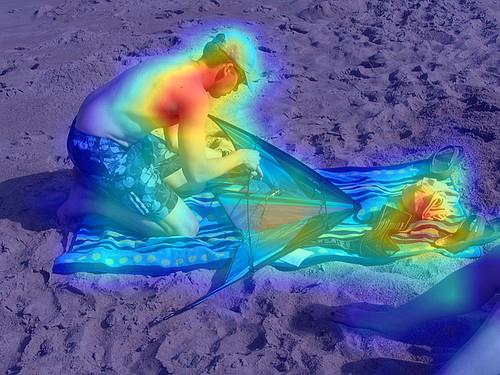

In [63]:
out = infer(model=detr, image_index=798)

torch.set_grad_enabled(True)

from pytorch_grad_cam import GradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2
import numpy as np

import torchvision.transforms as transforms

# Load and preprocess the image
img = out['image']
# img = img.resize((800, 800))
img = np.float32(img) / 255
transform_ = transforms.ToTensor()
tensor = transform_(img).unsqueeze(0)

target_layers = [model.backbone[-2].body.layer4[1].conv1,
                    model.backbone[-2].body.layer4[1].conv2,
                    model.backbone[-2].body.layer4[1].conv3,
]


# img = np.float32(img) / 255

# Calculate the CAM (this might need a different approach for DETR)
cam = EigenCAM(wrapped_model, target_layers)
grayscale_cam = cam(tensor)[0, :, :]
cam_image = show_cam_on_image(img, grayscale_cam, use_rgb=True)
Image.fromarray(cam_image)